<a href="https://colab.research.google.com/github/plaban1981/fasatai2022/blob/main/Is_it_a_bird%3F_Creating_a_model_from_your_own_data_fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Step 1: Download images of birds and non-birds

https://www.kaggle.com/code/jhoward/is-it-a-bird-creating-a-model-from-your-own-data?scriptVersionId=103376231&cellId=8

The basic steps we'll take are:

* Use DuckDuckGo to search for images of "bird photos"
* Use DuckDuckGo to search for images of "forest photos"
* Fine-tune a pretrained neural network to recognise these two groups
* Try running this model on a picture of a bird and see if it works.

In [1]:
! pip install -q duckduckgo_search

     |████████████████████████████████| 96 kB 6.6 MB/s 
     |████████████████████████████████| 357 kB 63.4 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.1.3 which is incompatible.


In [2]:
from duckduckgo_search import ddg_images
from fastcore.all import *

def search_images(term, max_images=30):
    print(f"Searching for '{term}'")
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

In [3]:
#NB: `search_images` depends on duckduckgo.com, which doesn't always return correct responses.
#    If you get a JSON error, just try running it again (it may take a couple of tries).
urls = search_images('bird photos', max_images=1)
urls[0]

Searching for 'bird photos'


'https://amazinganimalphotos.com/wp-content/uploads/2016/11/beautiful-birds.jpeg'

In [6]:
urls = search_images('damaged car photos', max_images=1)
urls[0]

Searching for 'damaged car photos'


'https://www.grough.co.uk/lib/img/editorial/seathwaite-damaged-car-01-1200.jpg'

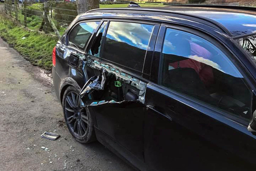

In [7]:
from fastdownload import download_url
dest = 'damged_car.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

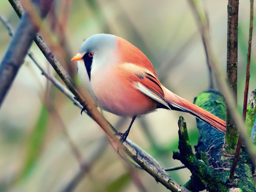

In [ ]:
from fastdownload import download_url
dest = 'bird.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

Searching for 'forest photos'


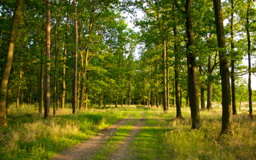

In [60]:
download_url(search_images('forest photos', max_images=1)[0], 'forest.jpg', show_progress=False)
Image.open('forest.jpg').to_thumb(256,256)

Searching for 'Mountain photos'


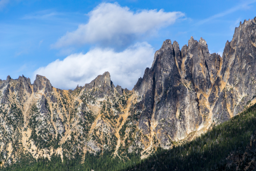

In [ ]:
download_url(search_images('Mountain photos', max_images=1)[0], 'Mountain.jpg', show_progress=False)
Image.open('Mountain.jpg').to_thumb(256,256)

Searching for 'Lion photos'


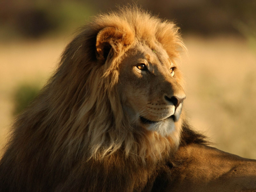

In [ ]:
download_url(search_images('Lion photos', max_images=1)[0], 'Lion.jpg', show_progress=False)
Image.open('Lion.jpg').to_thumb(256,256)

In [ ]:
searches = 'forest','bird'
path = Path('bird_or_not')
from time import sleep

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images(f'{o} sun photo'))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} shade photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

Searching for 'forest photo'
Searching for 'forest sun photo'
Searching for 'forest shade photo'
Searching for 'bird photo'
Searching for 'bird sun photo'
Searching for 'bird shade photo'


In [ ]:
searches = 'damaged car','new car'
path = Path('damaged_or_not')
from time import sleep

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images(f'{o} sun photo'))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} shade photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

Searching for 'damaged car photo'
Searching for 'damaged car sun photo'
Searching for 'damaged car shade photo'
Searching for 'new car photo'
Searching for 'new car sun photo'
Searching for 'new car shade photo'


In [8]:
searches = 'teddy bear','grizzly bear','black bear'
path = Path('damaged_or_not')
from time import sleep

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images(f'{o} sun photo'))
    sleep(10)
    download_images(dest, urls=search_images(f'{o} shade photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

Searching for 'teddy bear photo'
Searching for 'teddy bear sun photo'
Searching for 'teddy bear shade photo'
Searching for 'grizzly bear photo'
Searching for 'grizzly bear sun photo'
Searching for 'grizzly bear shade photo'
Searching for 'black bear photo'
Searching for 'black bear sun photo'
Searching for 'black bear shade photo'


#### me photos might not download correctly which could cause our model training to fail, so we'll remove them:

In [9]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

0

## Train our model

To train a model, we'll need DataLoaders, 

* Dataloaders which is an object that contains a training set (the images used to create a model) and a validation set (the images used to check the accuracy of a model -- not used during training). 
* In fastai we can create that easily using a DataBlock, and view sample images from it:

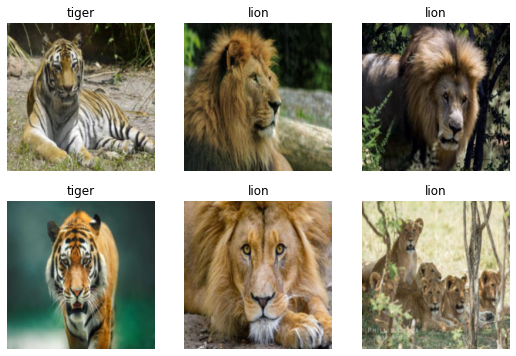

In [ ]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32) # dataloaders will provide the path to the image folder using path variable

dls.show_batch(max_n=6)

* **get_items=get_image_files** :To find all the inputs to our model, run the get_image_files function (which returns a list of all image files in a path).
* **get_y=parent_label** :The labels (y values) is the name of the parent of each file (i.e. the name of the folder they're in, which will be bird or forest).
* **item_tfms=[Resize(192, method='squish')]** :Before training, resize each image to 192x192 pixels by "squishing" it (as opposed to cropping it).

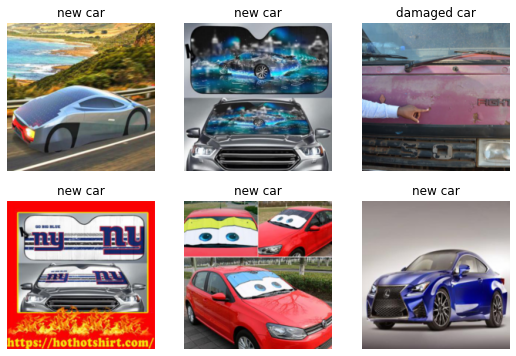

In [ ]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32) # dataloaders will provide the path to the image folder using path variable

dls.show_batch(max_n=6)

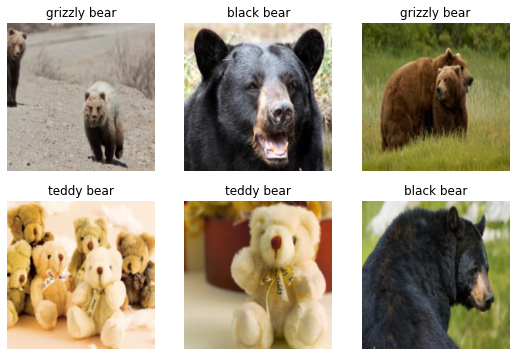

In [21]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32) # dataloaders will provide the path to the image folder using path variable

dls.show_batch(max_n=6)

## Build Model

In [22]:
learn = vision_learner(dls, resnet18, metrics=error_rate)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


* fastai comes with a helpful fine_tune() method which automatically uses best practices for fine tuning a pre-trained model, so we'll use that.

In [23]:
learn.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,1.199666,0.220070,0.076923,00:01


epoch,train_loss,valid_loss,error_rate,time
0,0.353024,0.196292,0.038462,00:01
1,0.248532,0.056016,0.019231,00:01
2,0.173779,0.061177,0.019231,00:01


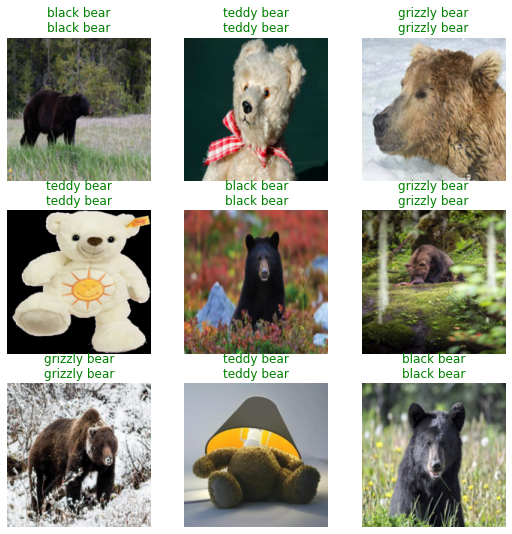

In [24]:
learn.show_results()

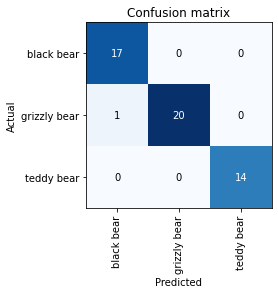

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

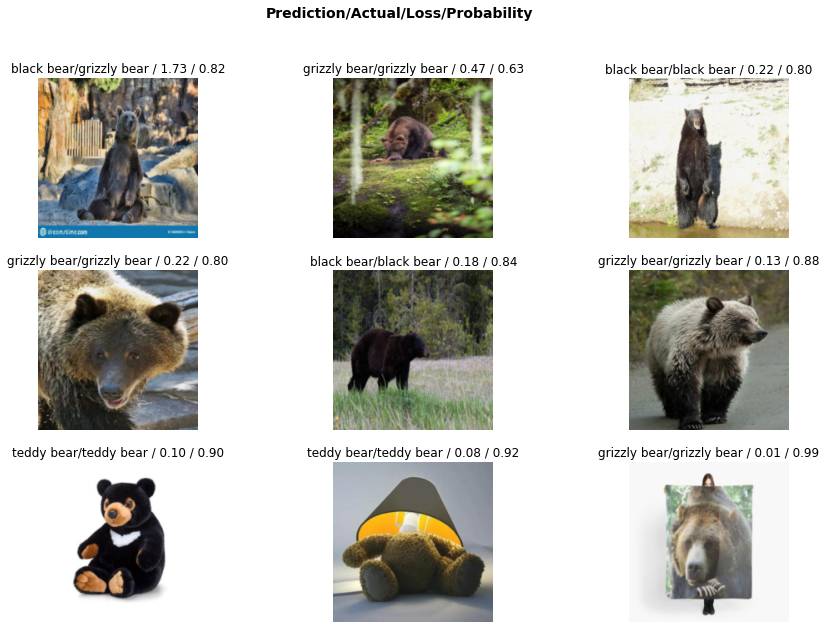

In [26]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))

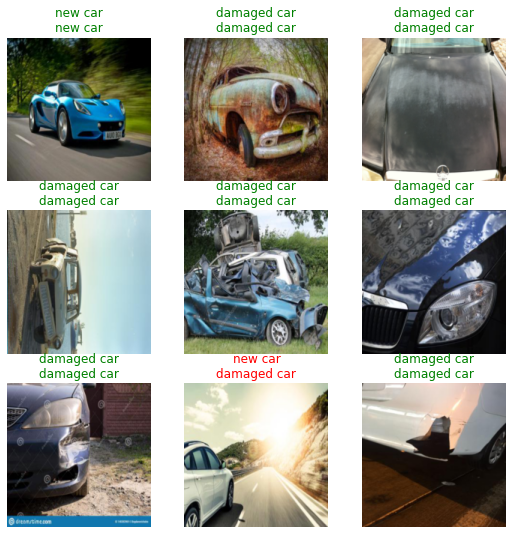

In [ ]:
learn.show_results()

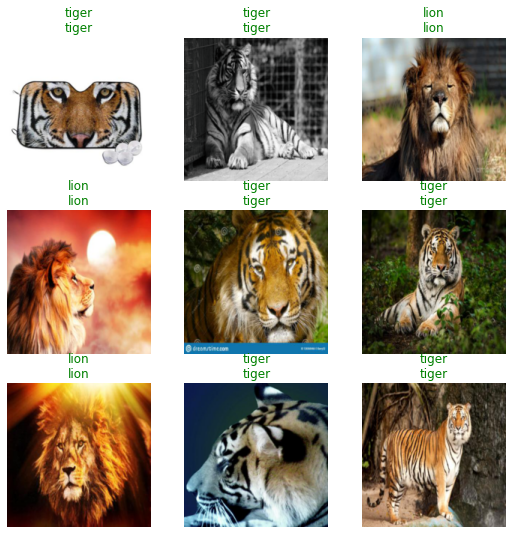

In [ ]:
learn.show_results()

## to get help with a command

In [ ]:
?? interp

In [ ]:
?interp

In [ ]:
interp = Interpretation.from_learner(learn)

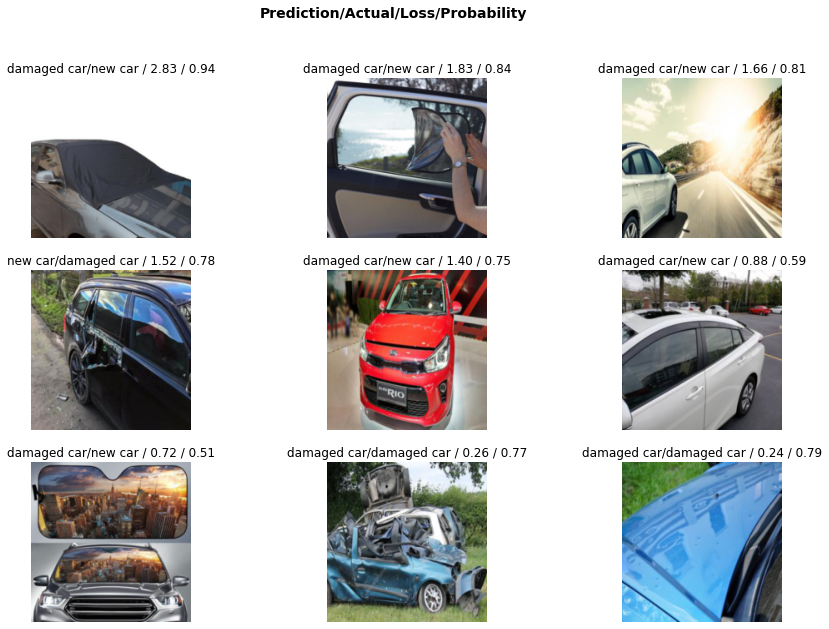

In [ ]:
interp.plot_top_losses(9, figsize=(15,10))

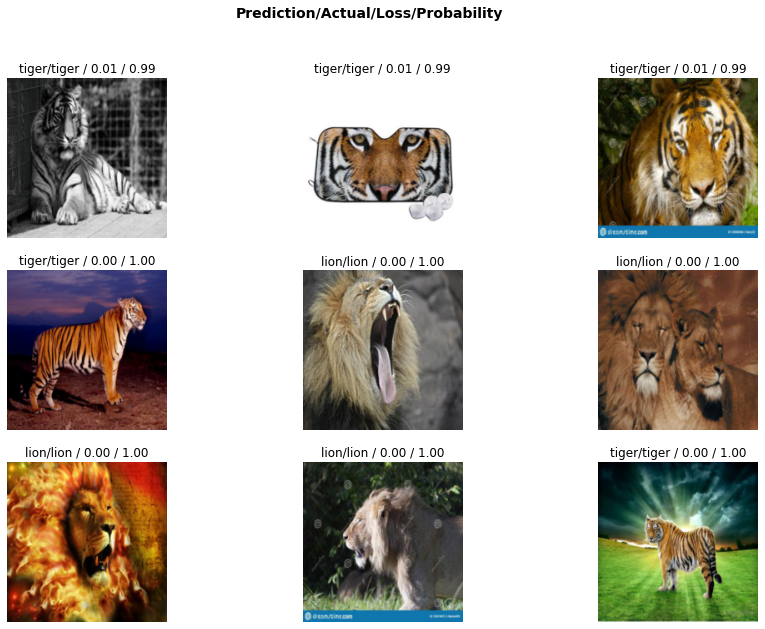

In [ ]:
interp.plot_top_losses(9, figsize=(15,10))

In [ ]:
is_lion,_,probs = learn.predict(PILImage.create('Lion.jpg'))
print(f"This is a: {is_lion}.")
print(f"Probability it's a Lion: {probs[0]:.4f}")

This is a: lion.
Probability it's a Lion: 1.0000


In [ ]:
is_bird,_,probs = learn.predict(PILImage.create('bird.jpg'))
print(f"This is a: {is_bird}.")
print(f"Probability it's a bird: {probs[0]:.4f}")

This is a: bird.
Probability it's a bird: 1.0000


In [ ]:
is_bird,_,probs = learn.predict(PILImage.create('bird.jpg'))
print(f"This is a: {is_bird}.")
print(f"Probability it's a bird: {probs[0]:.4f}")

In [ ]:
is_bird,_,probs = learn.predict(PILImage.create('forest.jpg'))
print(f"This is a: {is_bird}.")
print(f"Probability it's a bird: {probs[0]:.4f}")

This is a: forest.
Probability it's a bird: 0.0001


## Saving a Model

In [ ]:
learn.export('model.pkl')

## Single-label classification

In [33]:
from fastai.vision.all import *

* The dataset can be downloaded and decompressed with this line of code:

In [34]:
path = untar_data(URLs.PETS)

In [35]:
path

Path('/root/.fastai/data/oxford-iiit-pet')

*  We can check what is inside with the .ls() method.

In [36]:
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/images'),Path('/root/.fastai/data/oxford-iiit-pet/annotations')]

* **get_image_files** is a fastai function that helps us grab all the image files (recursively) in one folder.

In [37]:
files = get_image_files(path/"images")
len(files)

7390

* Label our data for the cats vs dogs problem

In [ ]:
files[0],files[6],files[10]

(Path('/root/.fastai/data/oxford-iiit-pet/images/scottish_terrier_92.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/german_shorthaired_2.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/leonberger_147.jpg'))

* the name of the file begins with a capital for cats, 
* and a lowercased letter for dogs:

In [38]:
def label_func(f): return f[0].isupper()

* To get our data ready for a model, we need to put it in a **DataLoaders object**
* Here we have a function that labels using the file names, so we will use **ImageDataLoaders.from_name_func**

https://docs.fast.ai/vision.data.html#imagedataloaders

In [47]:
dls = ImageDataLoaders.from_name_func(path, files, label_func, item_tfms=Resize(224))

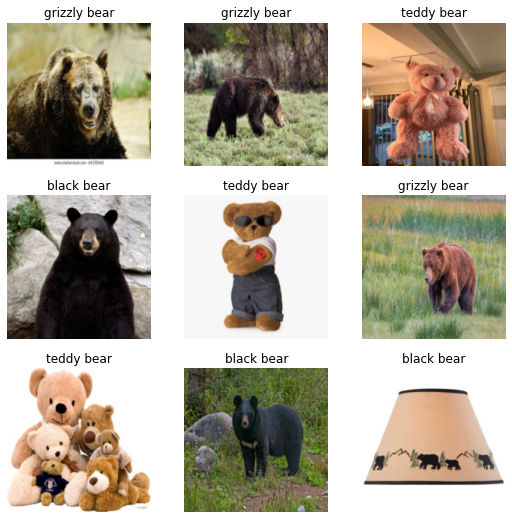

In [39]:
dls.show_batch()

* create a **Learner**, which is a fastai object that combines the data and a model for training, and uses transfer learning to fine tune a pretrained model in just two lines of code

In [40]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(1)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.406474,0.301757,0.096154,00:01


epoch,train_loss,valid_loss,error_rate,time
0,0.345119,0.143567,0.057692,00:01


## Make Predictions

In [41]:
learn.predict(files[0])

('teddy bear', TensorBase(2), TensorBase([1.9741e-04, 4.2887e-02, 9.5692e-01]))

In [42]:
learn.predict(files[6])

('grizzly bear', TensorBase(1), TensorBase([0.0291, 0.9154, 0.0555]))

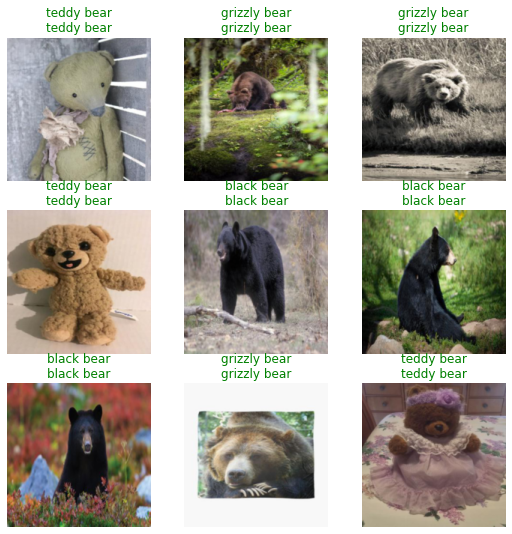

In [43]:
learn.show_results()

## Classifying breeds

In [44]:
files[0].name

'scottish_terrier_92.jpg'

* A regular expression that will catch the name

In [45]:
pat = r'^(.*)_\d+.jpg'
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(224))

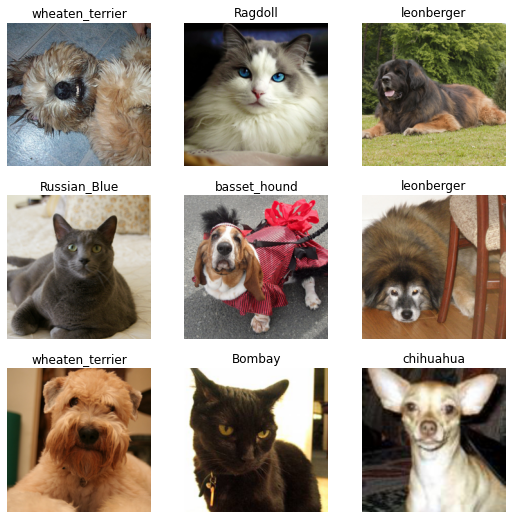

In [46]:
dls.show_batch()

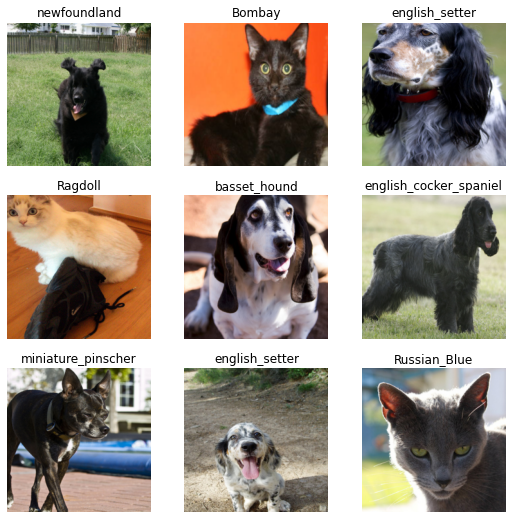

In [ ]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=RandomResizedCrop(224,min_scale=0.5))
dls.show_batch()

## Data Augmentation

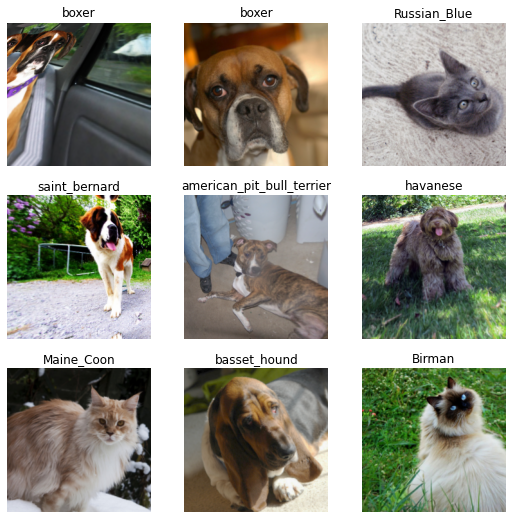

In [ ]:
from fastai.vision import augment
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(224),batch_tfms=aug_transforms(2))
dls.show_batch()

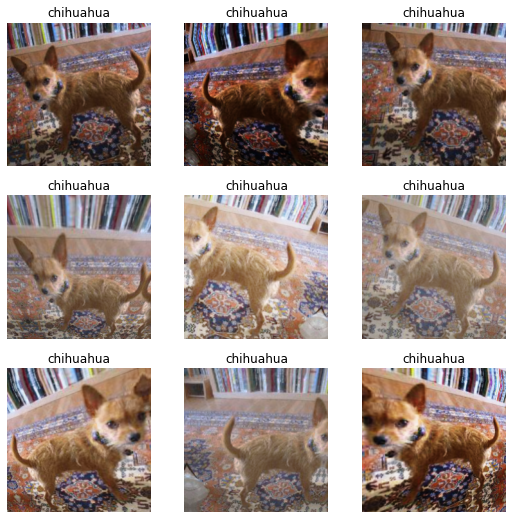

In [ ]:
dls = ImageDataLoaders.from_name_re(path, files, pat, item_tfms=Resize(224),batch_tfms=aug_transforms(2))
dls.show_batch(unique=True)

* https://docs.fast.ai/23_tutorial.vision.html

## Create Learner

In [48]:
learn = vision_learner(dls, resnet50, metrics=error_rate)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

* We used the default learning rate before, but we might want to find the best one possible. For this, we can use the learning rate finder:

SuggestedLRs(valley=0.0003311311302240938)

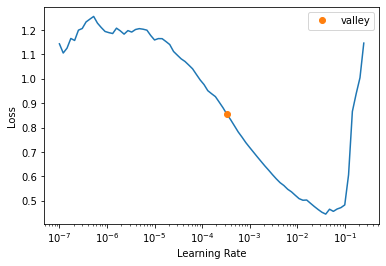

In [49]:
learn.lr_find()

In [50]:
learn.fine_tune(epochs=2,base_lr=3e-3)

epoch,train_loss,valid_loss,error_rate,time
0,0.101672,0.008835,0.004736,01:02


epoch,train_loss,valid_loss,error_rate,time
0,0.062140,0.043626,0.014208,01:11
1,0.035953,0.006829,0.002706,01:11


## Look at the predictions

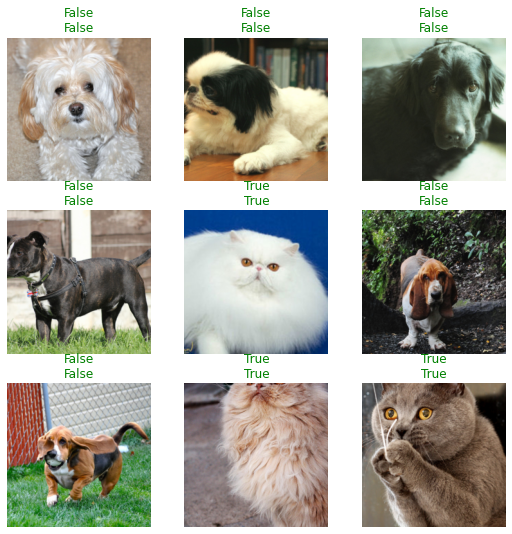

In [51]:
learn.show_results()

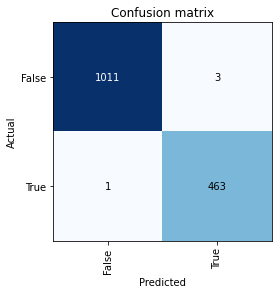

In [52]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

## Look where the model made the worse predictions:

In [53]:
interp = Interpretation.from_learner(learn)

* The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer.

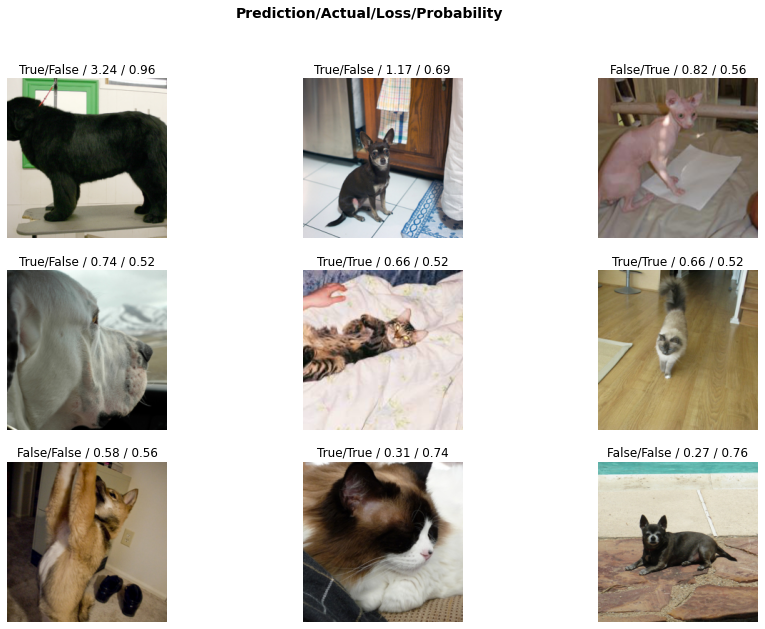

In [54]:
interp.plot_top_losses(9, figsize=(15,10))

##save the model

In [56]:
learn.export('/content/cat_dog_fastai.pkl')

## Make predictions

In [57]:
pip install -q gradio

     |████████████████████████████████| 6.1 MB 21.3 MB/s 
     |████████████████████████████████| 2.3 MB 4.9 MB/s 
     |████████████████████████████████| 84 kB 3.7 MB/s 
     |████████████████████████████████| 270 kB 69.4 MB/s 
     |████████████████████████████████| 112 kB 74.6 MB/s 
     |████████████████████████████████| 57 kB 5.6 MB/s 
     |████████████████████████████████| 54 kB 3.7 MB/s 
     |████████████████████████████████| 84 kB 2.4 MB/s 
     |████████████████████████████████| 55 kB 3.7 MB/s 
     |████████████████████████████████| 212 kB 46.9 MB/s 
     |████████████████████████████████| 63 kB 2.3 MB/s 
     |████████████████████████████████| 80 kB 10.3 MB/s 
     |████████████████████████████████| 68 kB 7.5 MB/s 
     |████████████████████████████████| 43 kB 2.4 MB/s 
     |████████████████████████████████| 4.1 MB 68.2 MB/s 
     |████████████████████████████████| 856 kB 4.9 MB/s 
     |████████████████████████████████| 594 kB 4.9 MB/s 


In [58]:
import gradio as gr 
def is_cat(x):return x[0].isupper()

Searching for 'dog photos'


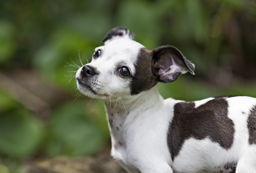

In [63]:
download_url(search_images('dog photos', max_images=1)[0], 'dog.jpg', show_progress=False)
Image.open('dog.jpg').to_thumb(256,256)

Searching for 'dunno photos'


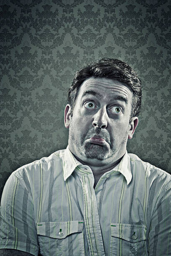

In [79]:
download_url(search_images('dunno photos', max_images=1)[0], 'dunno.jpg', show_progress=False)
Image.open('dunno.jpg').to_thumb(256,256)

Searching for 'cat photos'


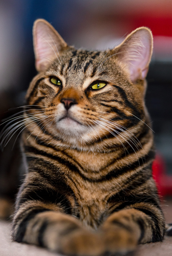

In [66]:
download_url(search_images('cat photos', max_images=1)[0], 'cat.jpg', show_progress=False)
Image.open('cat.jpg').to_thumb(256,256)

##Load the learner

In [64]:
learner = load_learner("/content/cat_dog_fastai.pkl")

In [65]:
learner.predict("/content/dog.jpg")

('False', TensorBase(0), TensorBase([9.9985e-01, 1.5293e-04]))

In [67]:
learner.predict("/content/cat.jpg")

('True', TensorBase(1), TensorBase([1.1418e-12, 1.0000e+00]))

In [68]:
categories = ('Dog','Cat')
def classify_img(img):
  pred,idx,probs = learner.predict(img)
  return dict(zip(categories,map(float,probs)))

In [71]:
classify_img("/content/cat.jpg")

{'Dog': 1.1417544427266835e-12, 'Cat': 1.0}

In [75]:
import gradio as gr
image = gr.inputs.Image(shape=(256,256))
label = gr.outputs.Label()
examples = ["dog.jpg","cat.jpg"]

/usr/local/lib/python3.7/dist-packages/gradio/inputs.py:257: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  "Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components",
/usr/local/lib/python3.7/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.7/dist-packages/gradio/outputs.py:197: UserWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  "Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components",
/usr/local/lib/python3.7/dist-packages/gradio/deprecation.py:40: UserWarning: The 'type' parameter has been deprecated. Use the Number component instead.
 

In [80]:
examples = ["dog.jpg","cat.jpg","dunno.jpg"]
gr.Interface(classify_img,
             "image", 
            "textbox",examples=examples).launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://10164.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces: https://huggingface.co/spaces


(<gradio.routes.App at 0x7efad307e610>,
 'http://127.0.0.1:7862/',
 'https://10164.gradio.app')

* fastai includes a handy GUI for data cleaning called **ImageClassifierCleaner** that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling:

In [27]:
from fastai.vision.widgets import *

In [28]:
#hide_output
cleaner = ImageClassifierCleaner(learn)#it runs a model
cleaner

* ImageClassifierCleaner doesn't actually do the deleting or changing of labels for you; it just returns the indices of items to change. 

* So, for instance, to delete (unlink) all images selected for deletion, we would run:

  **for idx in cleaner.delete(): cleaner.fns[idx].unlink()**

* To move images for which we've selected a different category, we would run:

  **for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)**


* Cleaning the data and getting it ready for your model are two of the biggest challenges for data scientists; they say it takes 90% of their time. The fastai library aims to provide tools that make it as easy as possible.

* The cleaner has now stored the list of images that we have changed or deleted 

In [29]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink() # all the labels selected for delete
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat) # all the folders selected for change will be moved top respective folders

In [30]:
learn.fine_tune(epochs=2,base_lr=3e-3)

epoch,train_loss,valid_loss,error_rate,time
0,0.112152,0.119099,0.057692,00:01


epoch,train_loss,valid_loss,error_rate,time
0,0.034001,0.138856,0.057692,00:01
1,0.034570,0.173483,0.057692,00:01


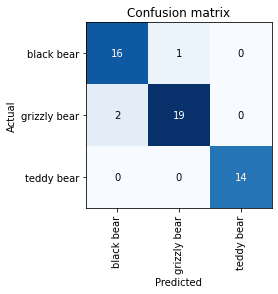

In [31]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

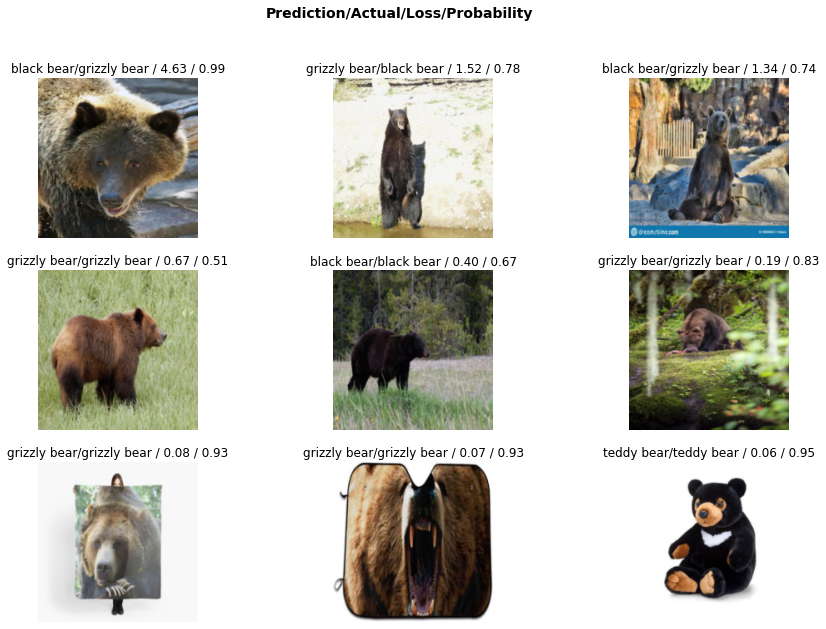

In [32]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))

##Gradio + Huggingface Spaces AI Tutorial

## Single-label classification - With the data block API

#### data block API to get our data in a DataLoaders.

A datablock is built by giving the fastai library a bunch of informations:

* the types used, through an argument called blocks: here we have images and categories, so we pass ImageBlock and CategoryBlock.
* how to get the raw items, here our function get_image_files.
* how to label those items, here with the same regular expression as before.
* how to split those items, here with a random splitter.
* the item_tfms and batch_tfms like before.